In [16]:
# %pip install -U sentence-transformers
# %pip install plotly
from sentence_transformers import SentenceTransformer

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import calinski_harabasz_score
from sklearn.ensemble import IsolationForest

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.pyplot import xticks
import nltk
from nltk.corpus import stopwords

## Data

In [2]:
df = pd.read_csv("../data/preprocessed_data.csv")
df.head()
print(len(df))

2985


In [3]:
df = df.drop_duplicates(subset=['speeches']).reset_index(drop=True)

In [4]:
len(df)

1926

## Sentence Embedding

In [5]:
sentence_model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

speeches = df["speeches"]
X = sentence_model.encode(speeches)

## Dimensional Reduction

In [6]:
dim = 2

# reductor = PCA(dim)
reductor = TSNE(dim)

X_emb = reductor.fit_transform(X)
df[[f"x{i}" for i in range(dim)]] = X_emb
df.head()

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


,speaker_id,speeches,party_id,party_name,county,orientation,sex,x0,x1
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F,44.797115,-4.434467
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F,52.816654,-3.512827
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F,45.276085,-1.440651
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F,46.487709,-2.405825
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F,36.366150,-17.580130


## Clustering

In [7]:
ks = []
calinski = []
inertias = []

for k in range(10, 150):
    model = KMeans(k)
    clusters = model.fit_predict(X_emb)

    ks.append(k)
    inertias.append(model.inertia_)
    calinski.append(calinski_harabasz_score(X_emb, clusters))

best_i = np.argmax(calinski)
best_k = ks[best_i]

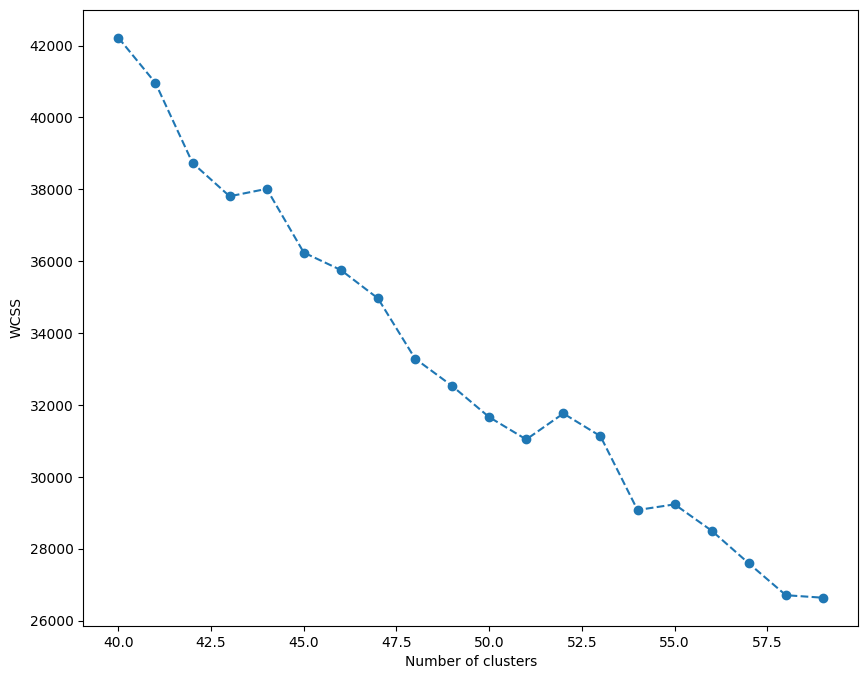

In [8]:
plt.figure(figsize=(10, 8))
plt.plot(ks[30:50],inertias[30:50], marker='o', linestyle='--', )
# plt.xticks(range(30, 51))

plt.xlabel("Number of clusters")
plt.ylabel("WCSS")

plt.show()

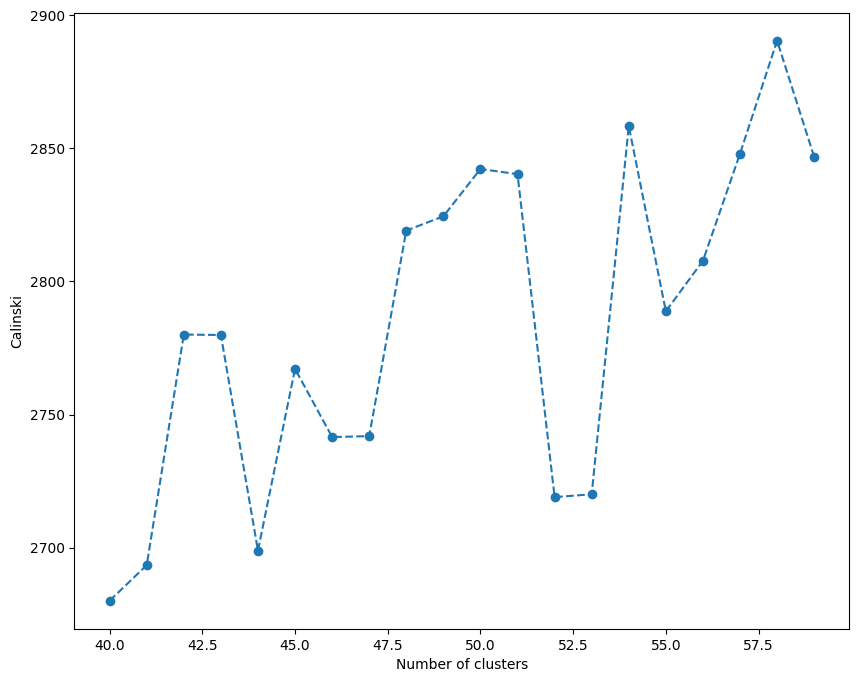

In [9]:
plt.figure(figsize=(10, 8))
plt.plot(ks[30:50], calinski[30:50], marker='o', linestyle='--')
plt.xlabel("Number of clusters")
plt.ylabel("Calinski")

plt.show()

In [10]:
selected_k = 42

model = KMeans(selected_k)
clusters = model.fit_predict(X_emb)

df["cluster"] = clusters
df.head()

,speaker_id,speeches,party_id,party_name,county,orientation,sex,x0,x1,cluster
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F,44.797115,-4.434467,34
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F,52.816654,-3.512827,29
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F,45.276085,-1.440651,34
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F,46.487709,-2.405825,34
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F,36.366150,-17.580130,10


In [18]:
stopwords_list = stopwords.words('english')

In [21]:
cluster_data

,speaker_id,speeches,party_id,party_name,county,orientation,sex,x0,x1,cluster,speeches_cleaned
47,#JoséMaríaFigaredoÁlvarezSala,Very good afternoon ladies and gentlemen We ar...,#party.Vox,Vox,ES,#orientation.RRF,M,19.944099,-28.666325,41,V e r g f e r n n l e n g e n l e e ...
144,#InésMaríaCañizaresPacheco,Thank you President Minister ladies and gentle...,#party.Vox,Vox,ES,#orientation.RRF,F,21.447886,-28.956758,41,T h n k u P r e e n M n e r l e n ...
162,#InésMaríaCañizaresPacheco,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F,12.220949,-29.901325,41,T h n k u P r e e n G f e r n n l e ...
208,#PatriciaDeLasHerasFernández,Thank you very much Madam President The amendm...,#party.Vox,Vox,ES,#orientation.RRF,F,23.169046,-32.635017,41,T h n k u v e r u c h M P r e e n ...
217,#EmilioJesúsDelValleRodríguez,With the coming of the presidency Ladies and g...,#party.Vox,Vox,ES,#orientation.RRF,M,9.022817,-29.933937,41,W h h e c n g f h e p r e e n c L ...
218,#EmilioJesúsDelValleRodríguez,With the coming of the presidency Ladies and g...,#party.Vox,Vox,ES,#orientation.RRF,M,8.999903,-29.857782,41,W h h e c n g f h e p r e e n c L ...
412,#RubénSilvanoMansoOlivar,Thank you so much Good morning ladies and gent...,#party.Vox,Vox,ES,#orientation.RRF,M,20.006092,-28.357895,41,T h n k u u c h G r n n g l e n ...
419,#RubénSilvanoMansoOlivar,Good afternoon ladies and gentlemen I will not...,#party.Vox,Vox,ES,#orientation.RRF,M,12.800160,-34.410450,41,G f e r n n l e n g e n l e e n I ...
499,#JuanJoséAizcorbeTorra,Thank you very much Madam President Ladies and...,#party.Vox,Vox,ES,#orientation.RRF,M,13.100595,-29.902414,41,T h n k u v e r u c h M P r e e n ...
500,#JuanJoséAizcorbeTorra,Mr. President thank you very much Ladies and g...,#party.Vox,Vox,ES,#orientation.RRF,M,16.008312,-29.006454,41,M r . P r e e n h n k u v e r u c h ...


In [23]:
import plotly.graph_objects as go

colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'white', 'orange', 'purple', 'pink', 'gray', 'brown']
color_dict = dict(zip(range(len(colors)), colors))

fig = go.Figure()
for cluster in range(selected_k):
    cluster_data = df[df['cluster'] == cluster]
    cluster_data['speeches_cleaned'] = cluster_data['speeches'].apply(lambda speech: ' '.join([word for word in str(speech).split(' ') if word not in stopwords_list]))
    
    fig.add_trace(go.Scatter(
        x=cluster_data['x0'],
        y=cluster_data['x1'],
        mode='markers',
        marker=dict(color=color_dict[cluster % len(colors)]),
        name=f'Cluster {cluster}',
        text=cluster_data['speeches_cleaned']
    ))

fig.update_layout(
    title='Gráfico de dispersión con colores por cluster',
)

fig.show()

/var/folders/b5/zsgbxty17rn21slqnmj3c2t00000gn/T/ipykernel_91810/2101642766.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/b5/zsgbxty17rn21slqnmj3c2t00000gn/T/ipykernel_91810/2101642766.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/b5/zsgbxty17rn21slqnmj3c2t00000gn/T/ipykernel_91810/2101642766.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

In [84]:
from collections import Counter
pd.set_option('display.max_columns', 500)


In [51]:
df['speeches_cleaned'] = df['speeches'].str.lower()
df['speeches_cleaned'] = df['speeches_cleaned'].apply(lambda speech: ' '.join([word for word in str(speech).split(' ') if word not in stopwords_list]))
speeches_by_cluster = df[['speeches_cleaned','cluster']].groupby(['cluster']).agg(list).reset_index()
speeches_by_cluster['top_10_words'] = speeches_by_cluster['speeches_cleaned'].map(lambda speeches: ' '.join([str(speech) for speech in speeches]))
speeches_by_cluster['top_10_words'] = speeches_by_cluster['top_10_words'].map(
    lambda speeches: [x for x, _ in Counter(str(speech) for speech in speeches.split(' ')).most_common(10)]
)

In [82]:
cluster_nr = 0
cluster_top_words = dict()

for i in speeches_by_cluster['top_10_words']:
    cluster_top_words[f'{cluster_nr=}'] = i
    cluster_nr += 1

In [85]:
pd.DataFrame(cluster_top_words)

,cluster_nr=0,cluster_nr=1,cluster_nr=2,cluster_nr=3,cluster_nr=4,cluster_nr=5,cluster_nr=6,cluster_nr=7,cluster_nr=8,cluster_nr=9,cluster_nr=10,cluster_nr=11,cluster_nr=12,cluster_nr=13,cluster_nr=14,cluster_nr=15,cluster_nr=16,cluster_nr=17,cluster_nr=18,cluster_nr=19,cluster_nr=20,cluster_nr=21,cluster_nr=22,cluster_nr=23,cluster_nr=24,cluster_nr=25,cluster_nr=26,cluster_nr=27,cluster_nr=28,cluster_nr=29,cluster_nr=30,cluster_nr=31,cluster_nr=32,cluster_nr=33,cluster_nr=34,cluster_nr=35,cluster_nr=36,cluster_nr=37,cluster_nr=38,cluster_nr=39,cluster_nr=40,cluster_nr=41
0,senator,government,'s,vote,senator,law,vote,also,senator,sitting,water,mr,president,vote,'s,government,law,senator,'s,would,government,health,spain,'s,vote,senator,minutes,would,also,spain,also,also,vote,minister,energy,rapporteur,vote,president,sitting,government,rapporteur,madrid
1,right,also,government,simultaneous,n't,'s,government,must,speak,representative,also,president,mr.,amendment,one,president,discussion,question,government,'s,tax,also,'s,law,proceed,debate,sitting,like,must,'s,must,would,annex,'s,spain,senator,followed,mr,vote,would,law,law
2,speak,would,spain,followed,minutes,women,agenda,would,right,government,agriculture,amendment,'m,see,government,italy,time,minutes,law,also,public,government,government,gentlemen,senator,senators,read,pnrr,energy,government,european,us,followed,one,'s,debate,senate,psd,suspended,also,draft,also
3,enlisted,health,spaniards,senate,floor,gentlemen,amendment,mr,registered,p.m.,'s,amendments,mr,senate,spain,also,vote,right,spain,article,us,would,us,spanish,law,call,president,thank,government,spaniards,us,important,refer,know,spaniards,call,simultaneous,az,p.m.,president,debate,public
4,'s,mr,n't,see,thank,ladies,article,president,'s,call,one,opinion,thank,followed,melilla,would,decree,explain,know,law,billion,president,spaniards,people,n.,closed,mr,today,us,spanish,italy,law,simultaneous,us,government,report,see,l,resumed,mr,report,government
5,de,'s,minister,annex,time,minister,amendments,work,enlisted,suspended,government,commission,'s,annex,n't,european,conference,three,minister,senator,'s,mr,spanish,government,trust,motions,debate,government,italy,minister,'s,animals,ballot,going,us,speak,annex,sp,suspend,'s,senator,contracts
6,declare,president,us,b,finish,violence,law,sport,declare,agenda,food,would,done,b,us,mr,'s,would,court,parliamentary,years,measure,much,public,amendment,would,since,cannot,minister,one,president,president,senate,'re,minister,general,b,de,president,even,next,would
7,open,even,people,refer,de,also,proceed,great,open,suspend,us,agenda,women,simultaneous,border,us,p.m.,colleagues,us,sport,increase,like,mr,us,government,ask,shall,question,'s,people,would,wild,approves,thank,spanish,resolution,refer,would,a.m.,us,item,sector
8,general,measures,law,ballot,colleagues,us,representative,today,discussion,resumed,must,senator,much,tabled,minister,even,government,words,vox,vote,debt,national,n't,spain,shall,rapporteur,secretary,president,country,us,war,measure,see,gentlemen,one,closed,approves,gasperi,work,measure,oral,work
9,discussion,law,spanish,amendment,give,children,decree,us,debate,would,farmers,l,like,refer,mr,'s,senate,like,spanish,president,million,us,energy,ladies,amendments,give,comments,us,today,n't,country,mr,b,president,party,agenda,amendment,'s,rule,time,call,president


In [54]:
df.to_csv("clusters.csv", index=False)

In [57]:
from wordcloud import WordCloud
from collections import Counter
from spacy.lang.en import English


def get_freqs(sentences, stopwords):
    counter = Counter()
    nlp = English()
    tokenizer = nlp.tokenizer

    for sentence in sentences:
        try:
            for word in tokenizer(sentence):
                if word.text.lower() not in stopwords:
                    counter[word.text.lower()] += 1
        except Exception as e:
            print(e)

    return counter

In [58]:
with open("../data/stopwordlist_en.txt", 'r') as f:
    stopwords = f.read().split("\n")

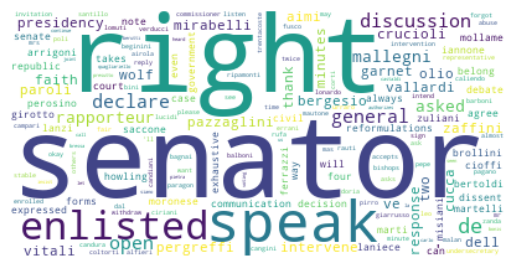

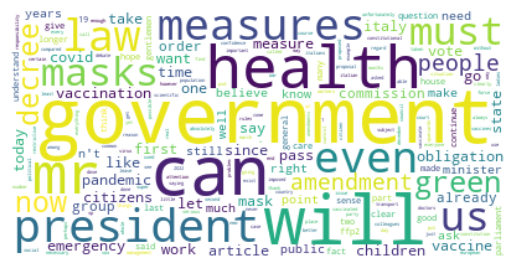

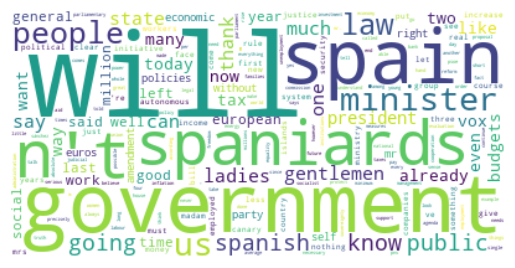

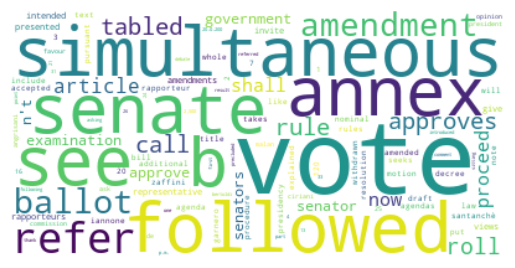

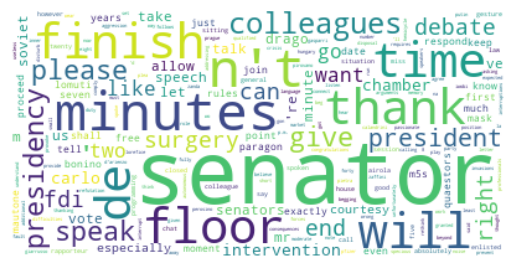

...

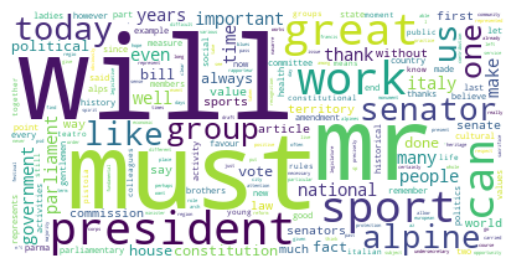

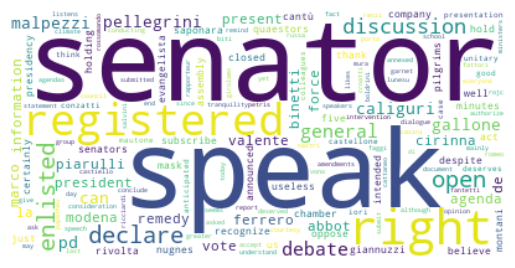

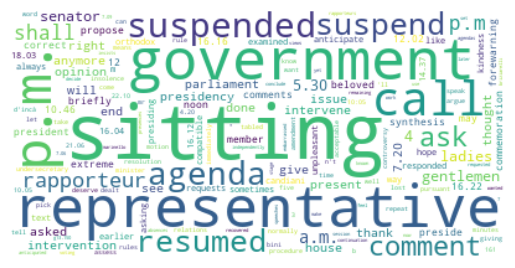

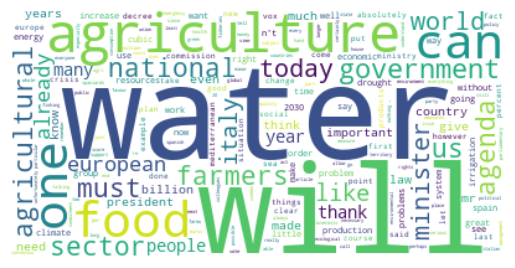

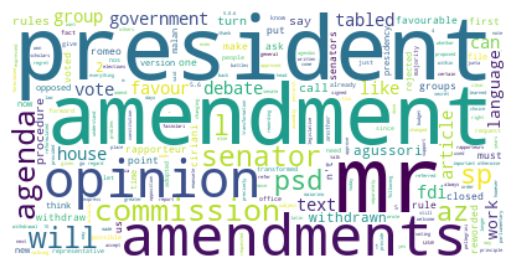

Argument 'string' has incorrect type (expected str, got float)


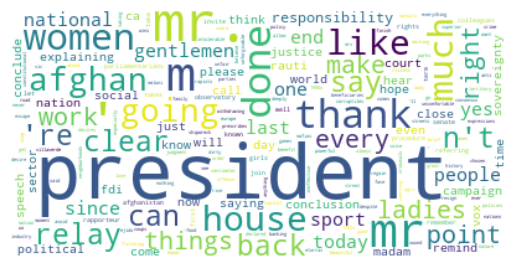

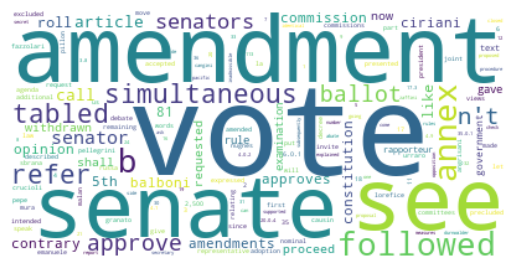

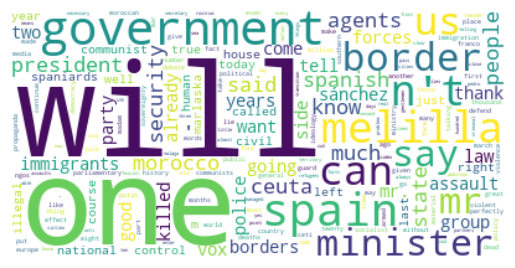

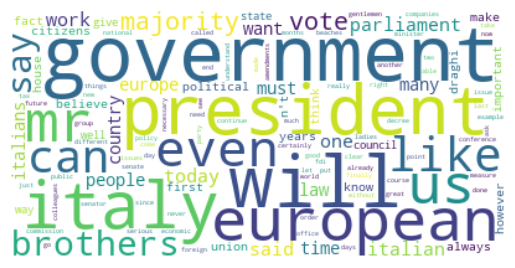

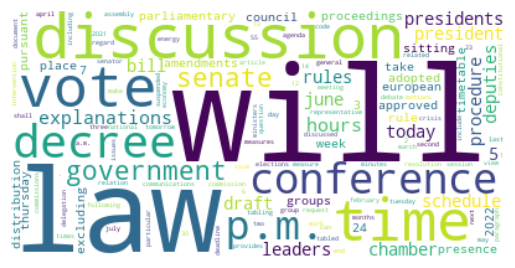

...

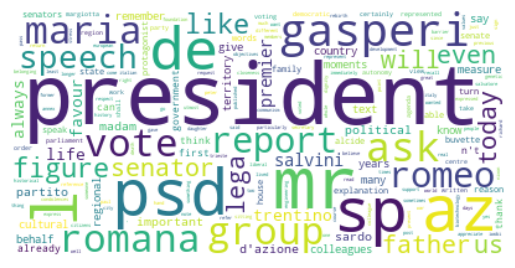

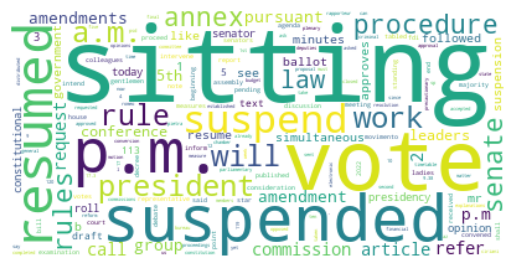

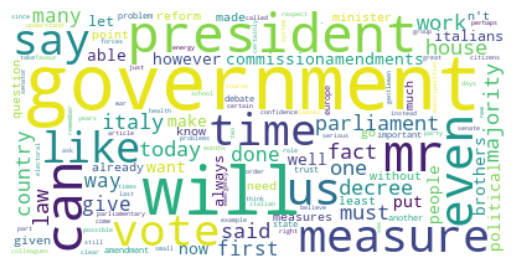

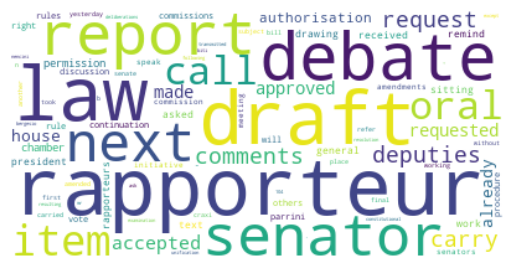

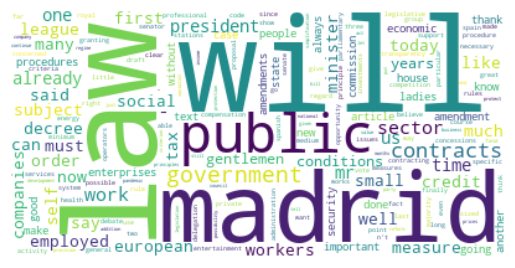

In [59]:
for i in range(selected_k):
    cluster_i = df[df["cluster"]==i]["speeches"]
    freqs = get_freqs(cluster_i, stopwords)
    wordcloud = WordCloud(background_color="white").generate_from_frequencies(freqs)
    
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.savefig(f"../out/cluster{i}.png")
    plt.show()

In [60]:
for i in range(selected_k):
    cluster_i = df[df["cluster"]==i]
    cluster_i.to_csv(f"../out/cluster{i}.csv", index=False)

In [61]:
df

,speaker_id,speeches,party_id,party_name,county,orientation,sex,x0,x1,cluster,speeches_cleaned
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F,44.797115,-4.434467,34,good afternoon ladies gentlemen mr echenique i...
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F,52.816654,-3.512827,29,thank president good morning ladies gentlemen ...
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F,45.276085,-1.440651,34,thank president good afternoon deputies govern...
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F,46.487709,-2.405825,34,thank president good afternoon ladies gentleme...
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F,36.366150,-17.580130,10,part menu worms processed vegetable meat much ...
...,...,...,...,...,...,...,...,...,...,...,...
1921,#BossiSimone,Mr President Mr Draghi I have listened careful...,#group.L-SP,Lega-Salvini Premier,IT,#orientation.RRF,M,11.940067,5.806826,30,mr president mr draghi listened carefully word...
1922,#BossiSimone,BOSSI Simone L SP PSd Az Mr President unfortun...,#group.L-SP,Lega-Salvini Premier,IT,#orientation.RRF,M,30.820881,-15.523028,10,bossi simone l sp psd az mr president unfortun...
1923,#BossiSimone,Mr President Mr Undersecretary ladies and gent...,#group.L-SP,Lega-Salvini Premier,IT,#orientation.RRF,M,15.463342,-2.583764,15,mr president mr undersecretary ladies gentleme...
1924,#PetrengaGiovanna,PETRENGA FdI Mr President today we are debatin...,#group.FdI,Fratelli d'Italia,IT,#orientation.RRF,F,-0.123634,-2.844578,7,petrenga fdi mr president today debating adopt...


In [62]:

for k in range(selected_k):
    print(f"Cluster {k}!")
    cluster_k = df[df["cluster"]==k]

    print(cluster_k.groupby("sex").count().iloc[:,0])
    print(cluster_k.groupby("county").count().iloc[:,0])
    print()
    print()

Cluster 0!
sex
M    102
Name: speaker_id, dtype: int64
county
IT    102
Name: speaker_id, dtype: int64


Cluster 1!
sex
F     8
M    36
Name: speaker_id, dtype: int64
county
ES     6
IT    38
Name: speaker_id, dtype: int64


Cluster 2!
sex
F    20
M    33
Name: speaker_id, dtype: int64
county
ES    53
Name: speaker_id, dtype: int64


Cluster 3!
sex
M    58
Name: speaker_id, dtype: int64
county
IT    58
Name: speaker_id, dtype: int64


Cluster 4!
sex
F     1
M    49
Name: speaker_id, dtype: int64
county
ES     4
IT    46
Name: speaker_id, dtype: int64


Cluster 5!
sex
F    37
M    16
Name: speaker_id, dtype: int64
county
ES    33
IT    20
Name: speaker_id, dtype: int64


Cluster 6!
sex
M    38
Name: speaker_id, dtype: int64
county
ES     1
IT    37
Name: speaker_id, dtype: int64


Cluster 7!
sex
F     8
M    34
Name: speaker_id, dtype: int64
county
ES     5
IT    37
Name: speaker_id, dtype: int64


Cluster 8!
sex
M    72
Name: speaker_id, dtype: int64
county
IT    72
Name: speaker_id, d